In [109]:
import xscen as xs
import xarray as xr
import cartopy.crs as ccrs
from xscen.config import CONFIG
import figanos.matplotlib as fg
import matplotlib.pyplot as plt
fg.utils.set_mpl_style('ouranos')

# Load configuration
xs.load_config(
    "paths_obs.yml", "config_obs.yml", verbose=(__name__ == "__main__"), reset=True
)

2025-06-04 13:19:36 INFO     xscen.config    Updated the config with paths_obs.yml.
2025-06-04 13:19:36 INFO     xscen.config    Updated the config with config_obs.yml.


In [72]:
pcat = xs.ProjectCatalog(CONFIG["paths"]["project_catalog"])
pcat.df

,id,type,processing_level,bias_adjust_institution,bias_adjust_project,mip_era,activity,driving_model,institution,source,...,member,xrfreq,frequency,variable,domain,date_start,date_end,version,format,path
0,ECMWF_ERA5-Land_NAM_reconstruction,reconstruction,extracted,NaN,NaN,NaN,NaN,NaN,ECMWF,ERA5-Land,...,NaN,D,day,"(pr, tasmin, tasmax, tas)",Quebec,1980-01-01,2021-12-31,NaN,zarr,/tank/jlavoie/abuyalo/obsflow/extracted/ECMWF_...
1,GovCan_RDRS_NAM_reconstruction,reconstruction,extracted,NaN,NaN,NaN,NaN,NaN,GovCan,RDRS,...,NaN,D,day,"(tasmin, pr, tas, tasmax)",Quebec,1980-01-01,2018-12-31,v21,zarr,/tank/jlavoie/abuyalo/obsflow/extracted/GovCan...
2,GovCan_CaSR_NAM_reconstruction,reconstruction,extracted,NaN,NaN,NaN,NaN,NaN,GovCan,CaSR,...,NaN,D,day,"(tasmin, pr, tas, tasmax)",Quebec,1980-01-01,2023-12-31,v31,zarr,/tank/jlavoie/abuyalo/obsflow/extracted/GovCan...
3,GovCan_AHCCD_CAN_station-tas,station-tas,extracted,NaN,NaN,NaN,NaN,NaN,GovCan,AHCCD,...,NaN,D,day,"(tasmin, tasmax, tas)",Quebec,1980-01-01,2023-12-31,gen3,zarr,/tank/jlavoie/abuyalo/obsflow/extracted/GovCan...
4,GovCan_AHCCD_CAN_station-pr,station-pr,extracted,NaN,NaN,NaN,NaN,NaN,GovCan,AHCCD,...,NaN,D,day,"(pr,)",Quebec,1980-01-01,2017-12-31,gen2,zarr,/tank/jlavoie/abuyalo/obsflow/extracted/GovCan...
5,ECMWF_ERA5-Land_NAM_reconstruction,reconstruction,indicators,NaN,NaN,NaN,NaN,NaN,ECMWF,ERA5-Land,...,NaN,YS-JAN,yr,"(pr_mean_annual, tg_mean_annual)",Quebec,1980-01-01,2021-01-01,NaN,zarr,/tank/jlavoie/abuyalo/obsflow/indicators/ECMWF...
6,ECMWF_ERA5-Land_NAM_reconstruction,reconstruction,indicators,NaN,NaN,NaN,NaN,NaN,ECMWF,ERA5-Land,...,NaN,QS-DEC,qtr,"(tg_mean_seasonal, pr_mean_seasonal)",Quebec,1980-03-01,2021-12-01,NaN,zarr,/tank/jlavoie/abuyalo/obsflow/indicators/ECMWF...
7,GovCan_AHCCD_CAN_station-pr,station-pr,indicators,NaN,NaN,NaN,NaN,NaN,GovCan,AHCCD,...,NaN,YS-JAN,yr,"(pr_mean_annual,)",Quebec,1980-01-01,2017-01-01,gen2,zarr,/tank/jlavoie/abuyalo/obsflow/indicators/GovCa...
8,GovCan_AHCCD_CAN_station-pr,station-pr,indicators,NaN,NaN,NaN,NaN,NaN,GovCan,AHCCD,...,NaN,QS-DEC,qtr,"(pr_mean_seasonal,)",Quebec,1980-03-01,2017-12-01,gen2,zarr,/tank/jlavoie/abuyalo/obsflow/indicators/GovCa...
9,GovCan_AHCCD_CAN_station-tas,station-tas,indicators,NaN,NaN,NaN,NaN,NaN,GovCan,AHCCD,...,NaN,YS-JAN,yr,"(tg_mean_annual,)",Quebec,1980-01-01,2023-01-01,gen3,zarr,/tank/jlavoie/abuyalo/obsflow/indicators/GovCa...


In [156]:
def plot(processing_level):    
    dict_ext= pcat.search(processing_level=processing_level).to_dataset_dict() # Getting all datasets with the given processing level from the catalog
    
    for id, ds in dict_ext.items(): # For each dataset     
        for var in ds.data_vars: # For each variable
            var_ds = ds[var] # Dataset for the current variable
            coords = var_ds.coords # Get the coordinates associated with this variable
            if 'lat' in coords and 'lon' in coords: # If the variable can be plotted on a 2D lat/lon plot
                
                if 'time' in var_ds.coords: # If the variable is defined in time, need to select a specific time to plot
                    ith_time = int(len(var_ds.time)/2) # The index of the time which will get plotted (we arbitrarily choose to plot the middle time)
                    var_ds = var_ds.isel(time=ith_time)
                    show_time = True
                else:
                    show_time = False
                
                if 'season' in var_ds.coords:  # If the variable is defined over seasons
                    # Create 1 row, 4 column subplot for all seasons
                    fig, axes = plt.subplots(1, 4, figsize=(20, 5), subplot_kw={"projection": ccrs.LambertConformal()}, constrained_layout=True)

                    for i, season in enumerate(var_ds.season.values):
                        season_ds = var_ds.sel(season=season)
                        
                        if ds.attrs['cat:type'] == 'reconstruction': # Reconstruction datasets (i.e., gridded data) provide values for every grid point
                            ax = fg.gridmap(season_ds, ax=axes[i], show_time=show_time, features=['coastline']) # we can thus use a gridmap plot
                            
                        else: # Otherwise, the dataset consists of point observations (e.g., weather stations), which only provide values at discrete locations
                            ax = fg.scattermap(season_ds, ax=axes[i], show_time=show_time, features=['coastline']) # we thus use a scatter plot

                        ax.set_title(season)
                    
                    plt.suptitle(f"{var}\n{id}", fontsize=14)
                    #plt.show()
                
                else:
                    
                    
                    

                    if ds.attrs['cat:type']=='reconstruction':
                        ax=fg.gridmap(var_ds, show_time=show_time, features=['coastline'])

                    else:
                        ax=fg.scattermap(var_ds, show_time=show_time, features=['coastline'])

                    ax.set_title(id, fontsize=14)
                    #plt.show()


--> The keys in the returned dictionary of datasets are constructed as follows:
	'id.domain.processing_level.xrfreq'


/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/utils.py:227: UserWarning: Attribute "description" not found.
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/utils.py:227: UserWarning: Attribute "description" not found.
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/utils.py:227: UserWarning: Attribute "description" not found.
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/utils.py:227: UserWarning: Attribute "description" not found.
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/plot.py:1748: UserWarning: 25 nan values were dropped when plotting the color values
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/utils.py:227: UserWarning: Attribute "description" not found.
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-pac

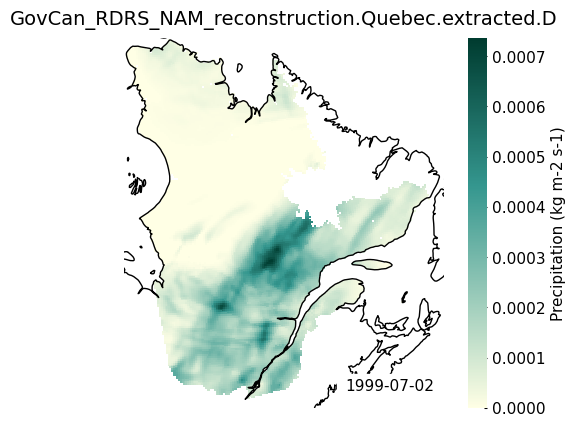

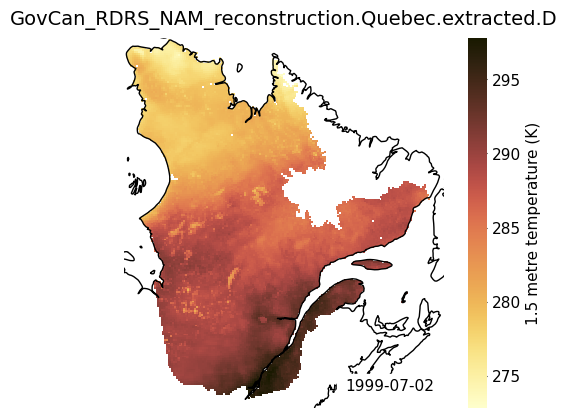

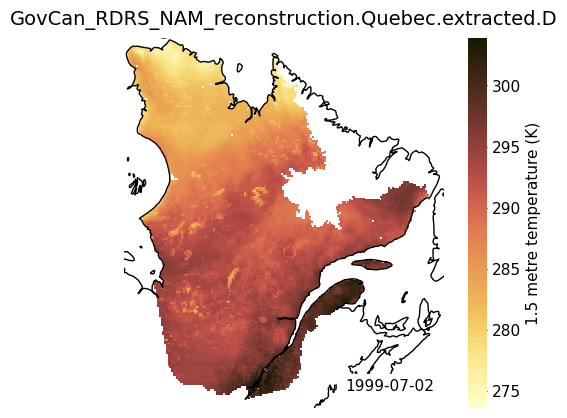

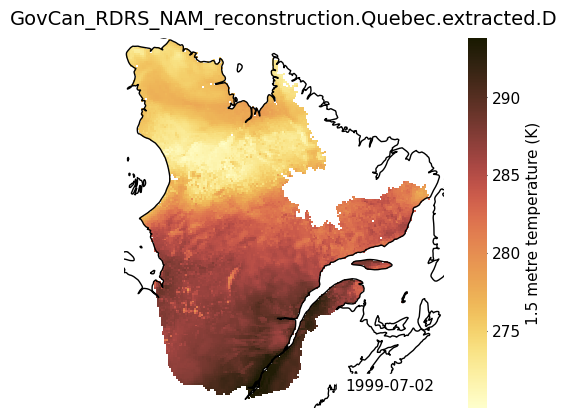

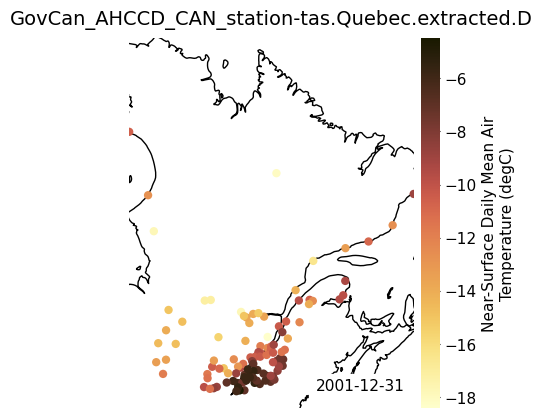

...

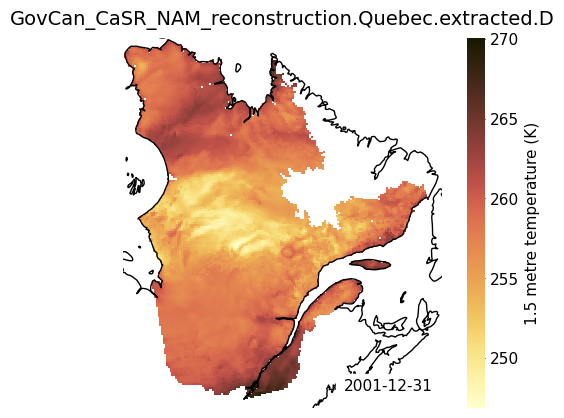

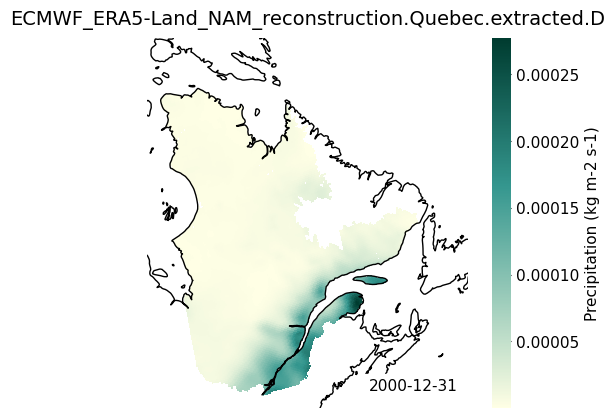

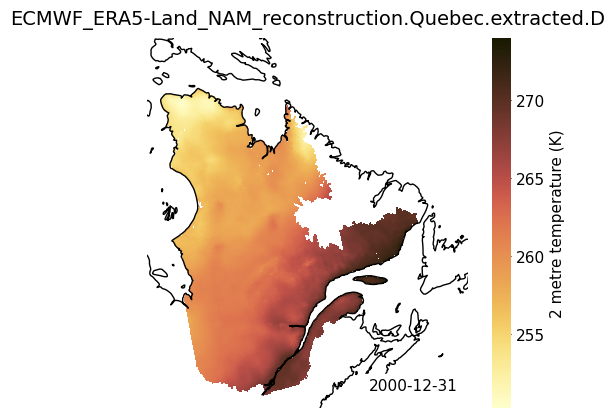

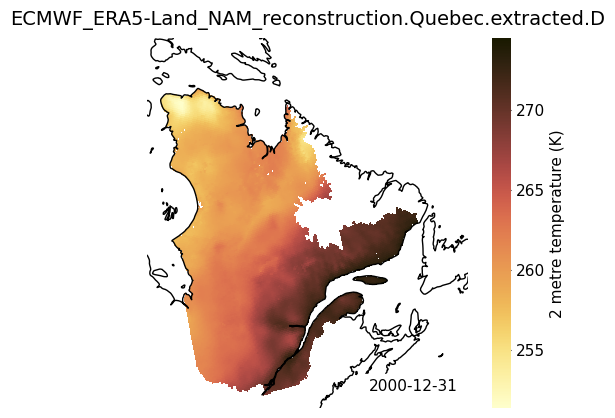

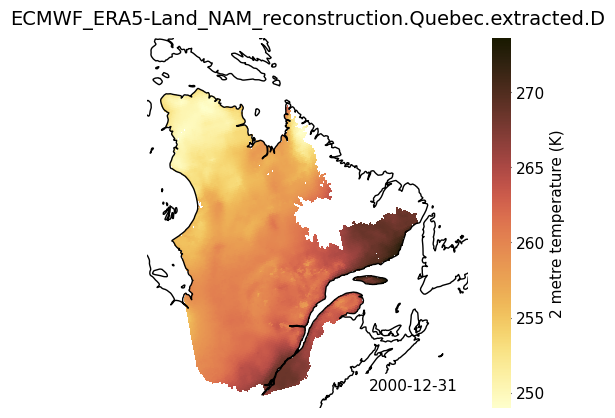

In [157]:
plot(processing_level='extracted')


--> The keys in the returned dictionary of datasets are constructed as follows:
	'id.domain.processing_level.xrfreq'


/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/plot.py:1748: UserWarning: 21 nan values were dropped when plotting the color values
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/plot.py:1748: UserWarning: 20 nan values were dropped when plotting the color values
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/plot.py:1748: UserWarning: 20 nan values were dropped when plotting the color values
/usr/local/DEV/mambaforge/envs/xscen-0.12/lib/python3.12/site-packages/figanos/matplotlib/plot.py:1748: UserWarning: 32 nan values were dropped when plotting the color values


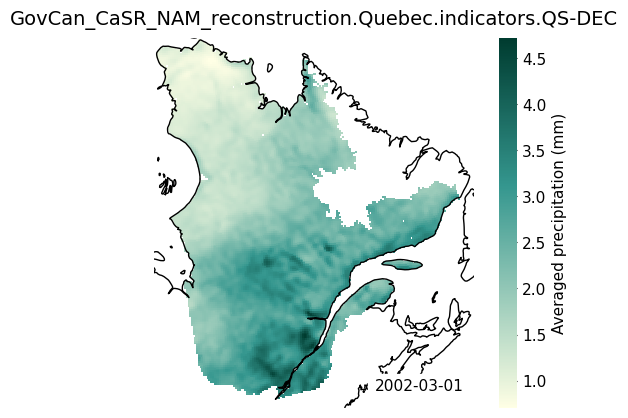

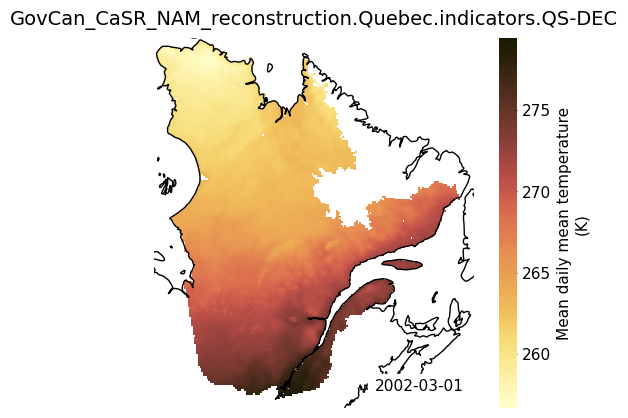

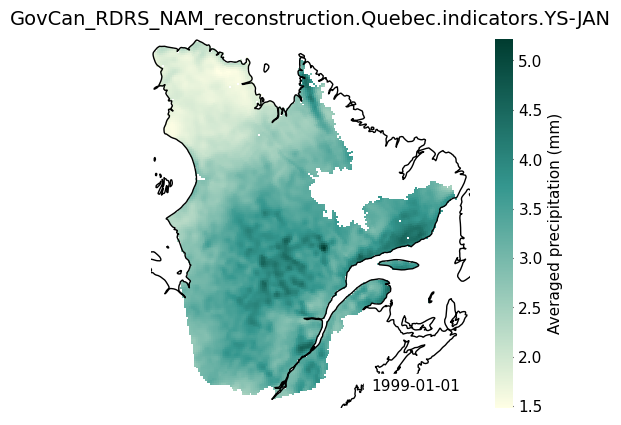

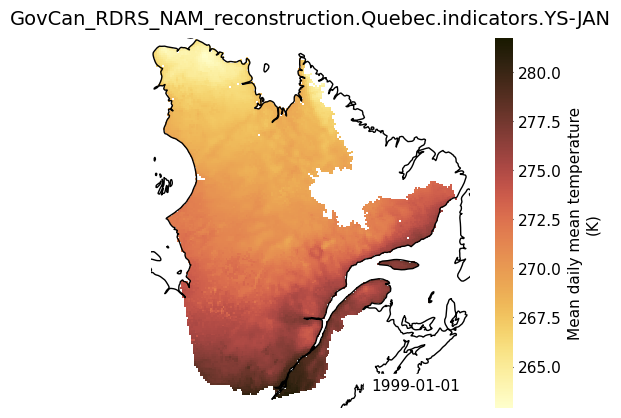

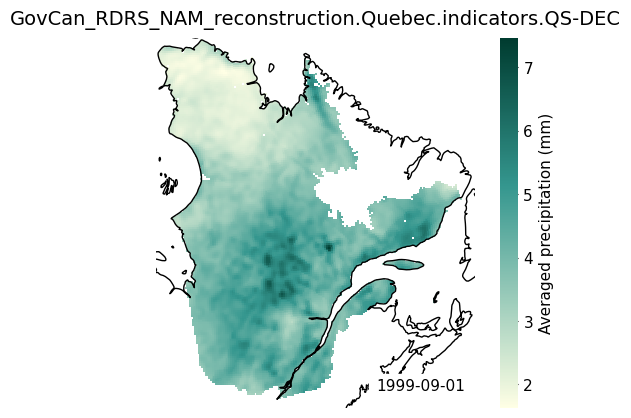

...

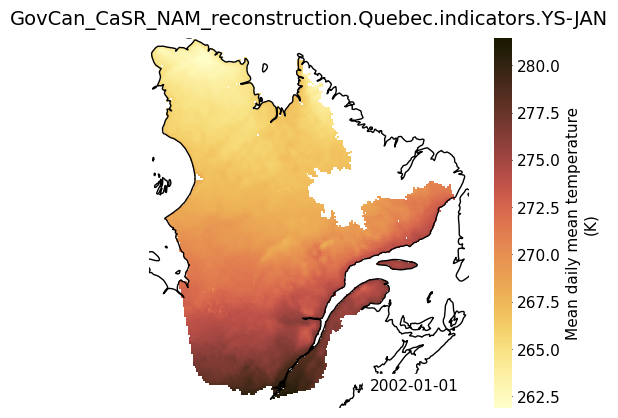

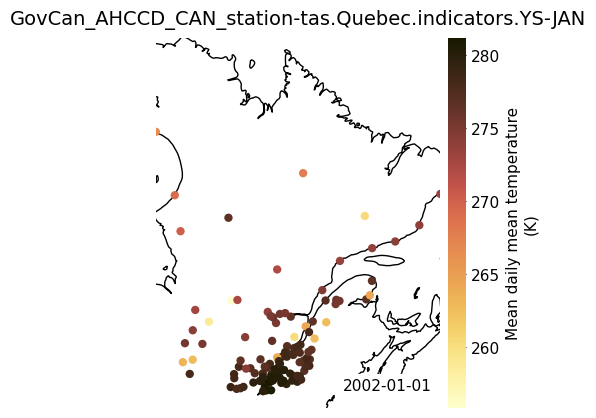

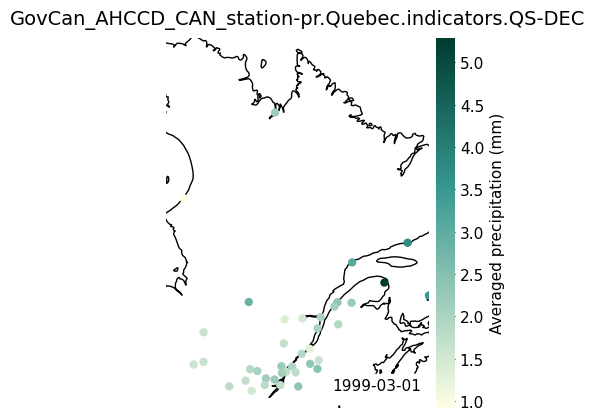

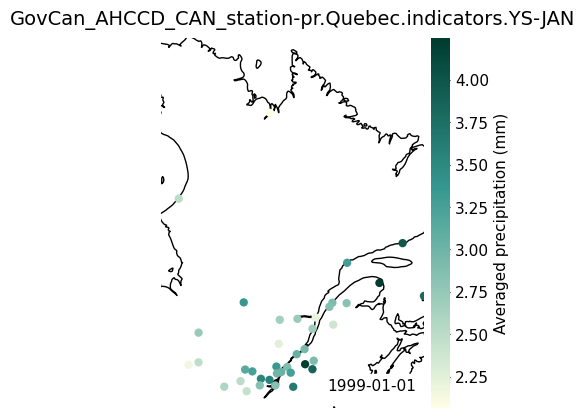

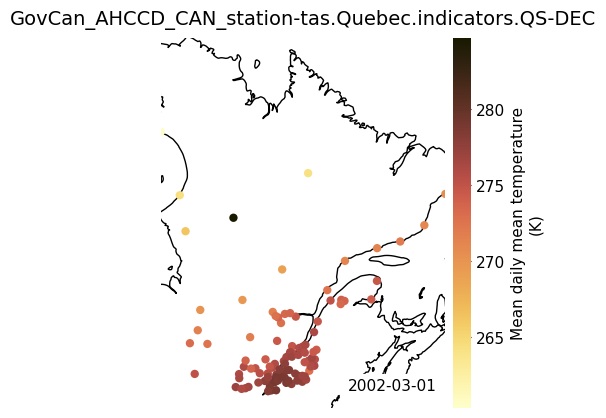

In [158]:
plot(processing_level='indicators')


--> The keys in the returned dictionary of datasets are constructed as follows:
	'id.domain.processing_level.xrfreq'


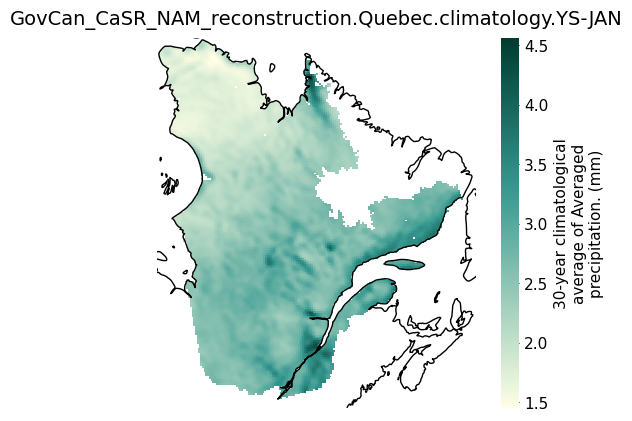

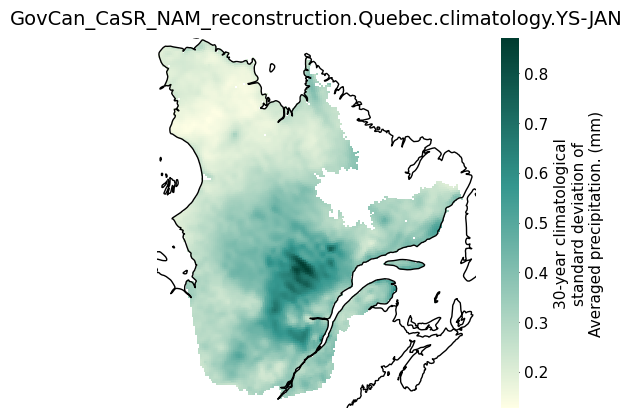

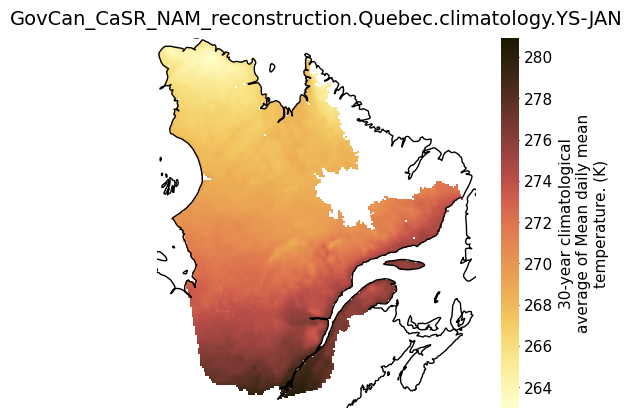

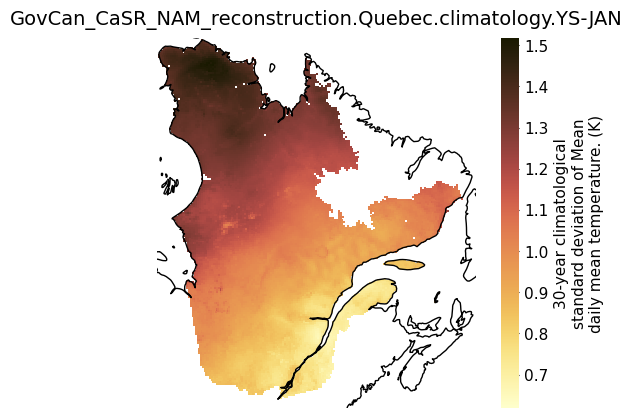

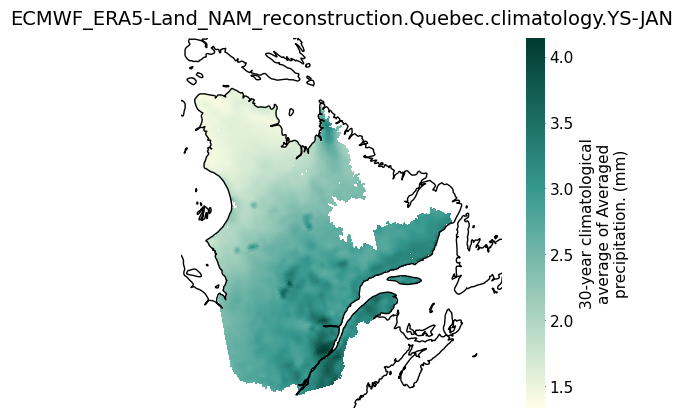

...

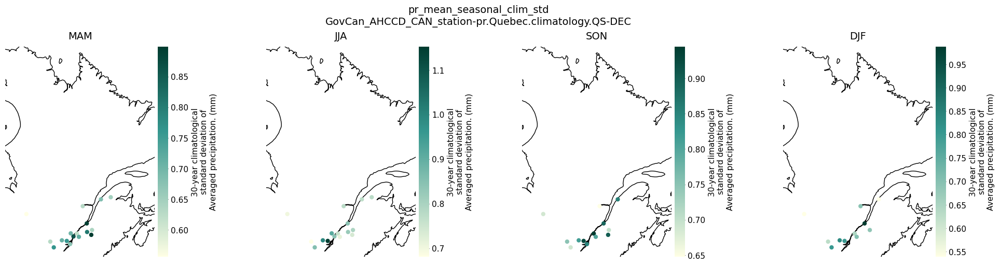

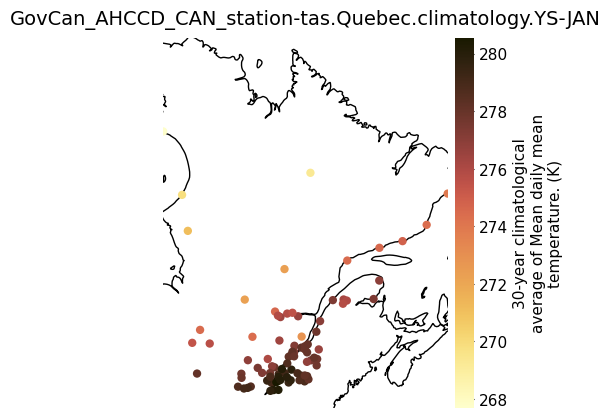

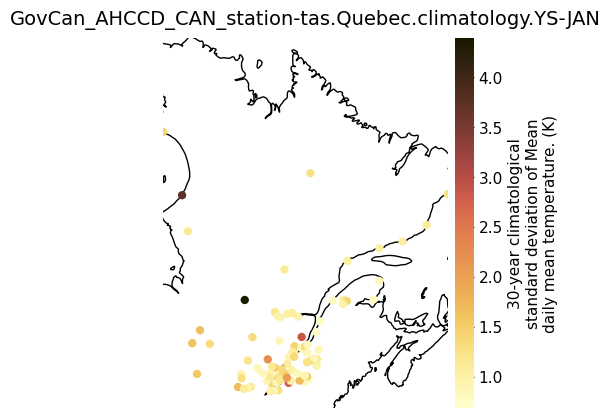

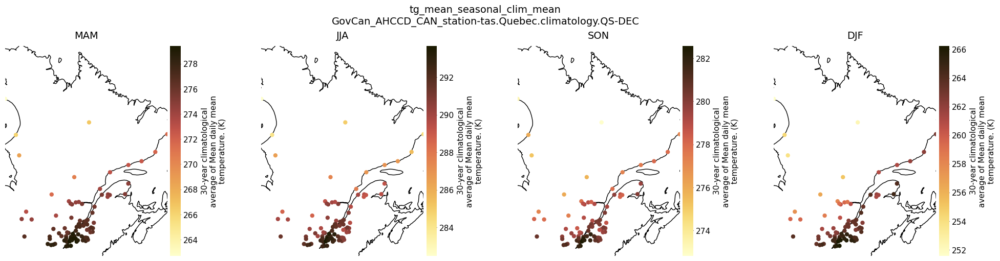

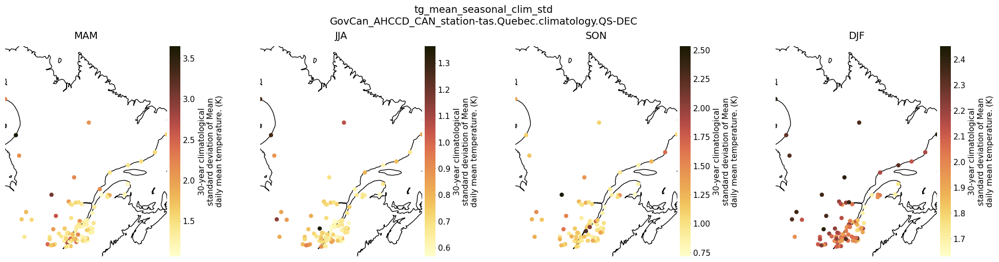

In [159]:
plot(processing_level='climatology')